$\Large\color{red}{\text{Announce: ebook "PyGMTSAR: Sentinel-1 Python InSAR: An Introduction"}}$
$\Large\color{red}{\text{is now available on Amazon, Apple, Kobo and many other bookstores.}}$

$\Large\color{blue}{\text{GeoMed3D M 6.5 Monte Cristo Range Earthquake 2020-05-15}}$

### Look for more PyGMTSAR examples:

* Google Colab - see GitHub page for [notebooks](https://github.com/mobigroup/gmtsar),

* Docker Images on [DockerHub](https://hub.docker.com/r/mobigroup/pygmtsar),

* GitHub [notebooks](https://github.com/mobigroup/gmtsar/tree/master/notebooks),

* GitHub Actions [console scripts](https://github.com/mobigroup/gmtsar/actions),

* Google Cloud VM -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/),

* Linux Debian and Ubuntu -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/),

* Apple Silicon and Intel hosts -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/).


### PyGMTSAR InSAR library, Geomed3D Geophysical Inversion Library, N-Cube 3D/4D GIS Data Visualization, etc. are my free-time Open Source projects.

I have STEM master’s degree in radio physics and in 2004 I have got the first prize of the All-Russian Physics competition for significant results in forward and inverse modeling for non-linear optics and holography, also applicable for modeling of Gravity, Magnetic, and Thermal fields and satellite interferometry processing. And I’m data scientist and software developer with 20 year’s experience in science and industrial development. I had been working on government contracts and universities projects and on projects for LG Corp, Google Inc, etc.

### You can sponsor my work on [Patreon](https://www.patreon.com/pechnikov) where I share my projects updates, publications, use cases, examples, and other useful information. To order some research and development and support, see my profile on freelance platform [Upwork](https://www.upwork.com/freelancers/~01e65e8e7221758623).

### Resources

* [Patreon](https://www.patreon.com/pechnikov),

* [YouTube Geological Models](https://www.youtube.com/channel/UCSEeXKAn9f_bDiTjT6l87Lg),

* [Virtual and Augmented Reality (VR/AR) Geological Models](https://mobigroup.github.io/ParaView-Blender-AR/),

* [GitHub](https://github.com/mobigroup),

* [LinkedIn](https://www.linkedin.com/in/alexey-pechnikov/),

* [Medium](https://medium.com/@pechnikov),

* [Habr](https://habr.com/ru/users/N-Cube/posts/).

### @ Alexey Pechnikov, 2023

$\large\color{blue}{\text{Hint: Use menu Cell} \to \text{Run All or Runtime} \to \text{Complete All or Runtime} \to \text{Run All}}$
$\large\color{blue}{\text{(depending of your localization settings) to execute the entire notebook}}$

## Google Colab Installation

In [1]:
import sys
if 'google.colab' in sys.modules:
    !apt-get update > /dev/null && apt install gdal-bin > /dev/null
    !{sys.executable} -m pip install -q matplotlib >/dev/null
    !{sys.executable} -m pip install -q git+https://github.com/mobigroup/geomed3d.git >/dev/null

In [2]:
if 'google.colab' in sys.modules:
    !apt install -y xvfb > /dev/null
    !{sys.executable} -m pip install pyvista xvfbwrapper > /dev/null
    import xvfbwrapper
    display = xvfbwrapper.Xvfb(width=800, height=600)
    display.start()

## Load and Setup Python Modules

In [3]:
import xarray as xr
import rioxarray as rio
import geopandas as gpd
import numpy as np
import os

from matplotlib import cm, colors
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
# plotting modules
import pyvista as pv
# magic trick for white background
pv.set_plot_theme("document")
import panel
panel.extension('vtk')

In [5]:
import geomed3d

# Parameters

In [6]:
# processing
DEPTH=5000

RESOLUTION = 35
SCALE = 4

GAMMA1=2000/RESOLUTION/SCALE
GAMMA2=3000/RESOLUTION/SCALE

DEM="../data/ref/USGS_NED_Monte_Cristo_50x50km_35m_32611.tif"
AREA="../data/ref/Monte_Cristo_AOI_10x10km.32611.geojson"
# https://landsat.usgs.gov/what-are-band-designations-landsat-satellites
RASTERS="../data/ref/COPERNICUS_S1_GRD_Monte_Cristo_Before_50x50km_35m_32611.tif"
#RASTERS="../data/ref//COPERNICUS_S1_GRD_Monte_Cristo_After_50x50km_35m_32611.tif"
BAND=''

# postprocessing
#STAT = 'density'
#STAT = 'valteration'
STAT = 'anomaly'

# Load source raster

In [7]:
raster0 = rio.open_rasterio(RASTERS.format(BAND)).squeeze().astype(float)\
    .coarsen({'y': SCALE, 'x': SCALE}, boundary='trim').mean()
if '_FillValue' in raster0.attrs:
    raster0.values[raster0.values==raster0._FillValue] = np.nan
raster0

<xarray.DataArray (y: 360, x: 361)>
array([[-12.12158963, -11.07875603, -10.15744089, ...,          nan,
                 nan,          nan],
       [-10.50284312, -11.03597127, -11.66541086, ...,          nan,
                 nan,          nan],
       [-11.89914115, -11.65730546, -12.57618446, ...,          nan,
                 nan,          nan],
       ...,
       [ -8.09513547,  -7.41315284, -11.05795667, ..., -11.58426429,
        -10.84108304, -11.40704006],
       [ -9.5330502 ,  -8.02156446,  -8.24704846, ..., -12.89034623,
        -12.30783076, -12.24474661],
       [ -9.39866174,  -9.89940774,  -9.3560025 , ...,  -9.3826574 ,
        -13.72621706, -12.76613017]])
Coordinates:
    band         int64 1
  * x            (x) float64 3.98e+05 3.982e+05 ... 4.483e+05 4.484e+05
  * y            (y) float64 4.249e+06 4.249e+06 ... 4.199e+06 4.199e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      VV

# Load DEM

In [8]:
if DEM is not None:
    dem = rio.open_rasterio(DEM).squeeze().astype(float)\
        .coarsen({'y': SCALE, 'x': SCALE}, boundary='trim').mean()
    if '_FillValue' in dem.attrs:
        dem.values[dem.values==dem._FillValue] = np.nan

# Pre-processing

In [9]:
raster = geomed3d.geomed3d.gaussian_range(raster0, GAMMA1, GAMMA2)

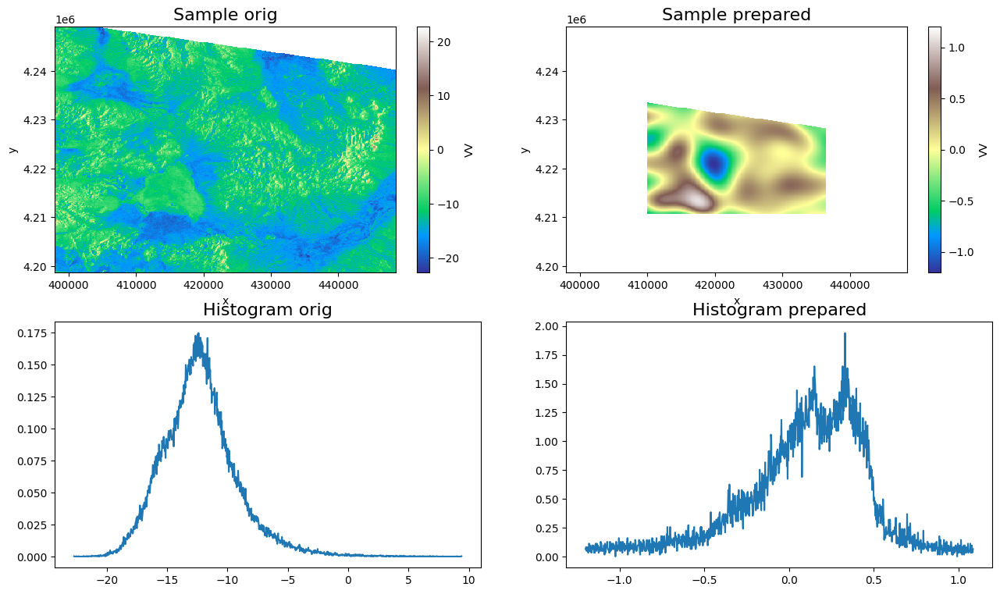

In [10]:
fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2, 2, figsize=(15.5, 9))

raster0.plot(ax=ax1, cmap='terrain')
ax1.set_title('Sample orig',fontsize=16)

raster.plot(ax=ax2, cmap='terrain')
ax2.set_title('Sample prepared',fontsize=16)

hist, bin_edges = np.histogram(raster0, bins=1000, density=True,
                              range=(np.nanmin(raster0.values),np.nanmax(raster0.values)))
ax3.plot(bin_edges[1:],hist)
ax3.set_title('Histogram orig',fontsize=16)

hist, bin_edges = np.histogram(raster, bins=1000, density=True,
                              range=(np.nanmin(raster.values),np.nanmax(raster.values)))
ax4.plot(bin_edges[1:],hist)
ax4.set_title('Histogram prepared',fontsize=16)

fig.subplots_adjust(hspace=0.2)
plt.show()

# Load shapefiles

### Load area

In [11]:
area = gpd.read_file(AREA)
area

,id,name,geometry
0,0,AOI M 6.5 - Monte Cristo Range Earthquake,"POLYGON ((418279.796 4218874.676, 428311.789 4..."


In [12]:
(minx, miny, maxx, maxy) = area.geometry[0].bounds
(minx, miny, maxx, maxy)

(418279.79557168996, 4218780.10596136, 428399.84678346815, 4228859.68112903)

### Make grid from loaded area with DEM values when provided

In [13]:
# xArray grid
grid = raster0.sel(x=slice(minx,maxx),y=slice(maxy,miny))
dem_grid = dem.sel(x=slice(minx,maxx),y=slice(maxy,miny))
grid

<xarray.DataArray (y: 72, x: 72)>
array([[-10.54376573, -11.87797182, -11.3608523 , ..., -10.81473985,
        -10.03218828, -12.03677172],
       [-10.56882174, -12.02482635, -11.76023433, ..., -10.56765328,
        -11.22442295, -10.61556884],
       [-11.12432568,  -9.64437797, -10.37443613, ...,  -7.24695988,
         -9.21631106, -10.44653456],
       ...,
       [-14.54338892, -16.94325512, -17.53713108, ..., -12.40999105,
        -12.30432796,  -3.15288915],
       [-13.18827809, -15.11498393, -17.6071893 , ..., -13.52692913,
        -12.50740173,  -0.86236658],
       [-12.20846788, -14.45415764, -17.05715598, ..., -14.29104328,
        -10.08657247,  -0.79804816]])
Coordinates:
    band         int64 1
  * x            (x) float64 4.183e+05 4.185e+05 ... 4.281e+05 4.283e+05
  * y            (y) float64 4.229e+06 4.229e+06 ... 4.219e+06 4.219e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      VV

In [14]:
# use z=0 when DEM is not defined
df_grid = grid.to_dataframe('orig')
if DEM is not None:
    df_grid['z'] = dem_grid.to_dataframe('z')['z']
df_grid = df_grid.reset_index()
df_grid.head()

,y,x,band,spatial_ref,orig,z
0,4228840.0,418320.0,1,0,-10.543766,1595.277397
1,4228840.0,418460.0,1,0,-11.877972,1609.290710
2,4228840.0,418600.0,1,0,-11.360852,1639.156631
3,4228840.0,418740.0,1,0,-12.527747,1667.527779
4,4228840.0,418880.0,1,0,-8.032650,1686.297897


### Map grid

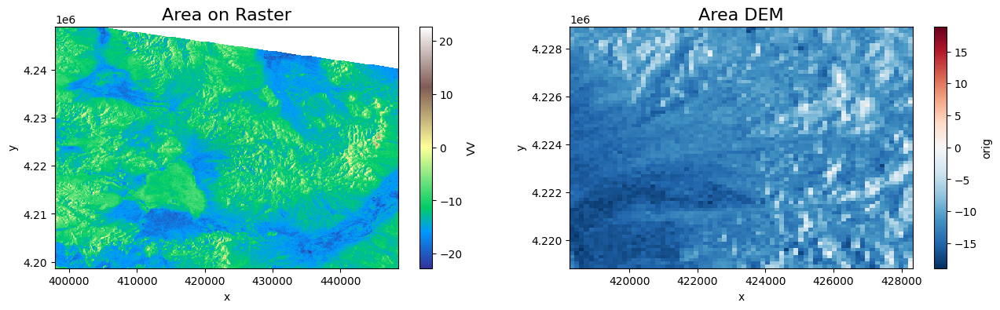

In [15]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(15.5, 4))

raster0.plot(cmap='terrain', ax=ax1)
ax1.scatter(df_grid.x,df_grid.y, s=0.00001, c='red')
ax1.set_title('Area on Raster',fontsize=16)

xr.Dataset.from_dataframe(df_grid.set_index(['y','x'])[['orig']]).orig.plot(ax=ax2)
ax2.set_title('Area DEM',fontsize=16)

fig.subplots_adjust(hspace=0.15)
plt.show()

# Sample 3D volume

### Calculate statistics

In [16]:
%%time
radius = int(round(DEPTH/(SCALE*RESOLUTION*0.707),0))
ds3d = geomed3d.geomed3d.compute(raster, df_grid, radius)
ds3d

CPU times: user 2.03 s, sys: 151 ms, total: 2.18 s
Wall time: 2.24 s


<xarray.Dataset>
Dimensions:  (y: 72, x: 72, z: 51)
Coordinates:
  * y        (y) float64 4.219e+06 4.219e+06 4.219e+06 ... 4.229e+06 4.229e+06
  * x        (x) float64 4.183e+05 4.185e+05 4.186e+05 ... 4.281e+05 4.283e+05
  * z        (z) float64 2.079e+03 1.98e+03 1.881e+03 ... -2.772e+03 -2.871e+03
Data variables:
    density  (z, y, x) float32 nan nan nan nan ... 0.08975 0.08799 0.08585
    anomaly  (z, y, x) float32 nan nan nan nan nan ... 2.159 2.058 2.07 2.099

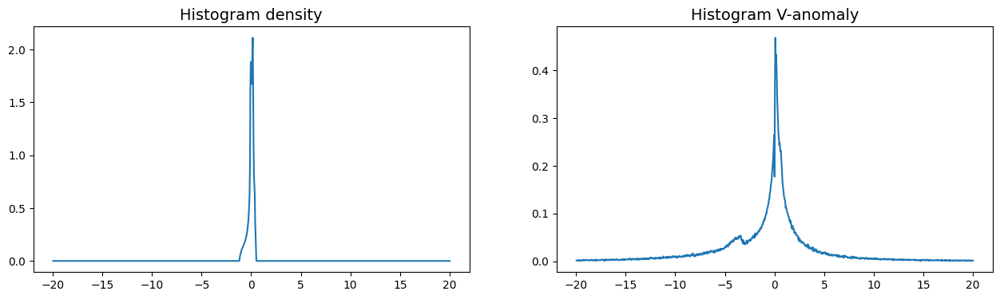

In [17]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15.5, 4))

hist, bin_edges = np.histogram(ds3d.density, bins=1000, density=True,
                              range=(-20,20))
ax1.plot(bin_edges[1:],hist)
ax1.set_title('Histogram density', fontsize=14)

hist, bin_edges = np.histogram(ds3d.anomaly, bins=1000, density=True,
                              range=(-20,20))
ax2.plot(bin_edges[1:],hist)
ax2.set_title('Histogram V-anomaly', fontsize=14)

plt.show()

## Save to VTK (version 1) files

In [18]:
if STAT != 'density':
    da = geomed3d.geomed3d.crop_histogram(ds3d[STAT])
else:
    da = ds3d[STAT]

da_smooth = geomed3d.geomed3d.idw_filter(geomed3d.geomed3d.median_filter(da))

/Users/mbg/Documents/github-public/geomed3d/geomed3d/geomed3d.py:261: RuntimeWarning: invalid value encountered in divide
  arr_idw = np.nansum(w * da.values.flatten()[inds[:,1:]], axis=1) / \


In [19]:
BASENAME = os.path.splitext(os.path.basename(RASTERS.format(BAND)))[0]
BASENAME

'COPERNICUS_S1_GRD_Monte_Cristo_Before_50x50km_35m_32611'

In [21]:
dx_km = np.diff(da.x)[0]/1000
filename = '../data/processed/%s_b%s_gamma%.1fkm,%.1fkm.%s.vtk' % (BASENAME,BAND,dx_km*GAMMA1,dx_km*GAMMA2,STAT)
geomed3d.vtk.da2vtk_scalar(da_smooth, filename)

In [22]:
# build interactive 3D plot
plotter = pv.Plotter(notebook=True)
axes = pv.Axes(show_actor=True, actor_scale=2.0, line_width=5)

grid = pv.read(filename).rotate_x(-20, point=axes.origin).rotate_z(135, point=axes.origin)
#plotter.add_mesh(grid.outline(), color="k")
#contours = grid.contour(isosurfaces=[20,30,40,50,60,70,80], scalars="anomaly")
contours = grid.contour(isosurfaces=11, scalars="anomaly")
plotter.add_mesh(contours, opacity=0.5, cmap='rainbow', ambient=0.2, show_scalar_bar=True)

plotter.show_axes()
plotter.add_title('Interactive 3D Model', font_size=32)
#p.show(screenshot='intf.png', jupyter_backend='panel', return_viewer=True)
plotter._on_first_render_request()
panel.panel(
    plotter.render_window, orientation_widget=plotter.renderer.axes_enabled,
    enable_keybindings=False, sizing_mode='stretch_width', min_height=600
)

VTKRenderWindowSynchronized(vtkCocoaRenderWindow, color_mappers=[LinearColorMapper(id='4ee...], min_height=600, orientation_widget=True, sizing_mode='stretch_width')